In [2]:
!pip install torch torchvision torchaudio librosa tqdm matplotlib scikit-learn soundfile --quiet

import os
import numpy as np
import librosa
import soundfile as sf
from tqdm import tqdm

print("✅ Libraries ready!")


✅ Libraries ready!


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Folder paths (update your Drive paths)
clean_dir = "/content/drive/MyDrive/unet/clean_wav"     # 10 clean files here
noise_dir = "/content/drive/MyDrive/unet/noise_wav"     # noise files here
mix_dir   = "/content/drive/MyDrive/unet/mixed_wav"     # where noisy mixtures will be saved
stft_dir  = "/content/drive/MyDrive/unet/dataset/stft"  # where STFTs will be stored

os.makedirs(mix_dir, exist_ok=True)
os.makedirs(stft_dir, exist_ok=True)

print("✅ Folders ready:")
print(clean_dir)
print(noise_dir)
print(stft_dir)


✅ Folders ready:
/content/drive/MyDrive/unet/clean_wav
/content/drive/MyDrive/unet/noise_wav
/content/drive/MyDrive/unet/dataset/stft


In [ ]:
import os
import numpy as np
import librosa
import soundfile as sf
from tqdm import tqdm

def prepare_balanced_mixes(clean_dir, noise_dir, mix_dir, mix_ratios=[0.3, 0.5, 0.7], target_sr=16000):
    """
    Create balanced noisy mixtures from multiple clean and noise WAVs.
    Each clean file is mixed with each noise file at given ratios.
    """
    os.makedirs(mix_dir, exist_ok=True)

    clean_files = sorted([f for f in os.listdir(clean_dir) if f.endswith(".wav")])
    noise_files = sorted([f for f in os.listdir(noise_dir) if f.endswith(".wav")])

    for clean_file in tqdm(clean_files, desc="🎧 Mixing clean-noise pairs"):
        clean_path = os.path.join(clean_dir, clean_file)
        clean_audio, _ = librosa.load(clean_path, sr=target_sr)

        for noise_file in noise_files:
            noise_path = os.path.join(noise_dir, noise_file)
            noise_audio, _ = librosa.load(noise_path, sr=target_sr)

            # Align lengths
            min_len = min(len(clean_audio), len(noise_audio))
            clean_audio_trim = clean_audio[:min_len]
            noise_audio_trim = noise_audio[:min_len]

            # Normalize each to same peak level
            clean_audio_trim = clean_audio_trim / (np.max(np.abs(clean_audio_trim)) + 1e-8)
            noise_audio_trim = noise_audio_trim / (np.max(np.abs(noise_audio_trim)) + 1e-8)

            # Mix for each ratio
            for r in mix_ratios:
                noisy = (1 - r) * clean_audio_trim + r * noise_audio_trim
                noisy = noisy / np.max(np.abs(noisy))  # normalize final mix

                mix_name = f"{clean_file[:-4]}_{noise_file[:-4]}_{int(r*100)}.wav"
                mix_path = os.path.join(mix_dir, mix_name)
                sf.write(mix_path, noisy, target_sr)

    print(f"✅ All balanced mixtures saved in: {mix_dir}")


In [ ]:
clean_dir = "/content/drive/MyDrive/unet/clean_wav"
noise_dir = "/content/drive/MyDrive/unet/noise_wav"
mix_dir   = "/content/drive/MyDrive/unet/mixed_balanced_wav"

prepare_balanced_mixes(clean_dir, noise_dir, mix_dir)


🎧 Mixing clean-noise pairs:   0%|          | 0/10 [00:10<?, ?it/s]


KeyboardInterrupt: 

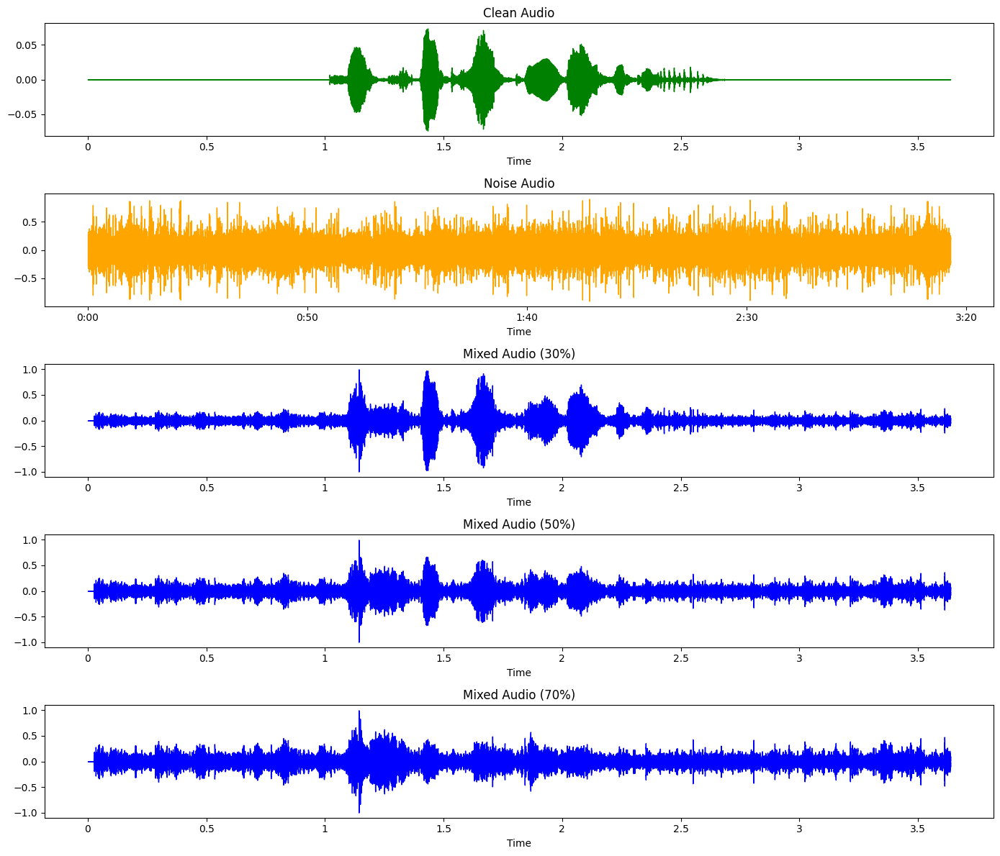

▶ Clean Audio:


▶ Noise Audio:


▶ Mixed Audio: 03-01-01-01-01-01-02_bubbles_30.wav


▶ Mixed Audio: 03-01-01-01-01-01-02_bubbles_50.wav


▶ Mixed Audio: 03-01-01-01-01-01-02_bubbles_70.wav


In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import os

# === Paths ===
base_dir = "/content/drive/MyDrive/unet/mixed_balanced_wav"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
noise_path = "/content/drive/MyDrive/unet/noise_wav/bubbles.wav"

# 3 mixed versions (change if filenames differ)
mix_files = [
    "03-01-01-01-01-01-02_bubbles_30.wav",
    "03-01-01-01-01-01-02_bubbles_50.wav",
    "03-01-01-01-01-01-02_bubbles_70.wav"
]

# === Load audio ===
clean, sr = librosa.load(clean_path, sr=16000)
noise, _ = librosa.load(noise_path, sr=16000)

mixed_audios = []
for f in mix_files:
    path = os.path.join(base_dir, f)
    audio, _ = librosa.load(path, sr=16000)
    mixed_audios.append((f, audio))

# === Plot ===
plt.figure(figsize=(14, 12))

plt.subplot(len(mixed_audios)+2, 1, 1)
librosa.display.waveshow(clean, sr=sr, color='green')
plt.title("Clean Audio")

plt.subplot(len(mixed_audios)+2, 1, 2)
librosa.display.waveshow(noise, sr=sr, color='orange')
plt.title("Noise Audio")

for i, (name, audio) in enumerate(mixed_audios, start=3):
    plt.subplot(len(mixed_audios)+2, 1, i)
    librosa.display.waveshow(audio, sr=sr, color='blue')
    plt.title(f"Mixed Audio ({name.split('_')[-1].replace('.wav','')}%)")

plt.tight_layout()
plt.show()

# === Listen ===
print("▶ Clean Audio:")
ipd.display(ipd.Audio(clean, rate=sr))

print("▶ Noise Audio:")
ipd.display(ipd.Audio(noise, rate=sr))

for name, audio in mixed_audios:
    print(f"▶ Mixed Audio: {name}")
    ipd.display(ipd.Audio(audio, rate=sr))


In [ ]:
import os
import numpy as np
import librosa
from tqdm import tqdm

def prepare_stft_dataset(clean_dir, mixed_dir, output_root, sr=16000, n_fft=1024, hop_length=256):
    """
    Prepare dataset for speech denoising model:
    - Extracts noisy magnitude, clean magnitude, and noisy phase
    - Saves as .npy files
    """
    # === Create folders ===
    os.makedirs(os.path.join(output_root, "noisy_mag"), exist_ok=True)
    os.makedirs(os.path.join(output_root, "clean_mag"), exist_ok=True)
    os.makedirs(os.path.join(output_root, "phase"), exist_ok=True)

    mixed_files = [f for f in os.listdir(mixed_dir) if f.endswith(".wav")]
    print(f"Total mixed files found: {len(mixed_files)}")

    for f in tqdm(mixed_files, desc="Generating STFT dataset"):
        mixed_path = os.path.join(mixed_dir, f)

        # Get corresponding clean file name
        base_clean_name = f.split("_")[0]  # e.g., "03-01-01-01-01-01-02"
        clean_path = os.path.join(clean_dir, base_clean_name + ".wav")

        if not os.path.exists(clean_path):
            print(f"⚠️ Skipping {f} — clean file not found.")
            continue

        # === Load ===
        noisy, _ = librosa.load(mixed_path, sr=sr)
        clean, _ = librosa.load(clean_path, sr=sr)

        # === Compute STFT ===
        noisy_stft = librosa.stft(noisy, n_fft=n_fft, hop_length=hop_length)
        clean_stft = librosa.stft(clean, n_fft=n_fft, hop_length=hop_length)

        # === Extract components ===
        noisy_mag = np.abs(noisy_stft)
        clean_mag = np.abs(clean_stft)
        phase = np.angle(noisy_stft)

        # === Save ===
        np.save(os.path.join(output_root, "noisy_mag", f.replace(".wav", "_noisy_mag.npy")), noisy_mag)
        np.save(os.path.join(output_root, "clean_mag", f.replace(".wav", "_clean_mag.npy")), clean_mag)
        np.save(os.path.join(output_root, "phase", f.replace(".wav", "_phase.npy")), phase)

    print("\n✅ Dataset preparation complete!")
    print(f"Saved to: {output_root}")


# === Paths ===
clean_dir = "/content/drive/MyDrive/unet/clean_wav"
mixed_dir = "/content/drive/MyDrive/unet/mixed_balanced_wav"
output_root = "/content/drive/MyDrive/unet/dataset"




In [ ]:
prepare_stft_dataset(clean_dir, mixed_dir, output_root)



Total mixed files found: 660


Generating STFT dataset: 100%|██████████| 660/660 [00:36<00:00, 18.12it/s]


✅ Dataset preparation complete!
Saved to: /content/drive/MyDrive/unet/dataset


In [ ]:
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, random_split

class DenoiseDataset(Dataset):
    def __init__(self, noisy_dir, clean_dir):
        self.noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.endswith("_noisy_mag.npy")])
        self.noisy_dir = noisy_dir
        self.clean_dir = clean_dir

    def __len__(self):
        return len(self.noisy_files)

    def __getitem__(self, idx):
        noisy_path = os.path.join(self.noisy_dir, self.noisy_files[idx])
        clean_path = os.path.join(self.clean_dir, self.noisy_files[idx].replace("noisy", "clean"))

        noisy = np.load(noisy_path)
        clean = np.load(clean_path)

        # Normalize
        noisy = (noisy - noisy.min()) / (noisy.max() - noisy.min() + 1e-8)
        clean = (clean - clean.min()) / (clean.max() - clean.min() + 1e-8)

        # Add channel dimension
        noisy = torch.tensor(noisy).unsqueeze(0).float()
        clean = torch.tensor(clean).unsqueeze(0).float()

        return noisy, clean

# === Paths ===
dataset_root = "/content/drive/MyDrive/unet/dataset"
noisy_dir = os.path.join(dataset_root, "noisy_mag")
clean_dir = os.path.join(dataset_root, "clean_mag")

# === Load dataset ===
full_dataset = DenoiseDataset(noisy_dir, clean_dir)

# Split into train, val, test (80/10/10)
train_size = int(0.8 * len(full_dataset))
val_size = int(0.1 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

train_ds, val_ds, test_ds = random_split(full_dataset, [train_size, val_size, test_size])

train_dl = DataLoader(train_ds, batch_size=4, shuffle=True)
val_dl = DataLoader(val_ds, batch_size=4)
test_dl = DataLoader(test_ds, batch_size=1)

print(f"✅ Dataset split: {train_size} train, {val_size} val, {test_size} test")


✅ Dataset split: 528 train, 66 val, 66 test


In [ ]:
import torch
from torch.utils.data import Dataset
import numpy as np
import os

class SpeechDataset(Dataset):
    def __init__(self, noisy_dir, clean_dir, max_frames=256):
        self.noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.endswith(".npy")])
        self.clean_files = sorted([f for f in os.listdir(clean_dir) if f.endswith(".npy")])
        self.noisy_dir = noisy_dir
        self.clean_dir = clean_dir
        self.max_frames = max_frames

    def pad_or_crop(self, x):
        freq, time = x.shape
        if time < self.max_frames:
            pad = np.zeros((freq, self.max_frames - time))
            x = np.concatenate([x, pad], axis=1)
        else:
            x = x[:, :self.max_frames]
        return x

    def __len__(self):
        return len(self.noisy_files)

    def __getitem__(self, idx):
        noisy = np.load(os.path.join(self.noisy_dir, self.noisy_files[idx]))
        clean = np.load(os.path.join(self.clean_dir, self.clean_files[idx]))
        noisy = self.pad_or_crop(noisy)
        clean = self.pad_or_crop(clean)
        return torch.tensor(noisy).unsqueeze(0).float(), torch.tensor(clean).unsqueeze(0).float()


In [ ]:
from torch.utils.data import DataLoader, random_split

noisy_dir = "/content/drive/MyDrive/unet/dataset/noisy_mag"
clean_dir = "/content/drive/MyDrive/unet/dataset/clean_mag"

dataset = SpeechDataset(noisy_dir, clean_dir, max_frames=256)

n = len(dataset)
train_len = int(0.8 * n)
val_len = int(0.1 * n)
test_len = n - train_len - val_len

train_ds, val_ds, test_ds = random_split(dataset, [train_len, val_len, test_len])

train_dl = DataLoader(train_ds, batch_size=8, shuffle=True)
val_dl = DataLoader(val_ds, batch_size=8)
test_dl = DataLoader(test_ds, batch_size=8)

print(f"✅ Dataset split: {train_len} train, {val_len} val, {test_len} test")


✅ Dataset split: 528 train, 66 val, 66 test


In [ ]:
noisy_batch, clean_batch = next(iter(train_dl))
print(noisy_batch.shape, clean_batch.shape)


torch.Size([8, 1, 513, 256]) torch.Size([8, 1, 513, 256])


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
# === U-Net Model ===
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.net(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )
    def forward(self, x):
        return self.net(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, 2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, 1)
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1, bilinear=True):
        super().__init__()
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import time

# === Device ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🚀 Using device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

# === Model, Loss, Optimizer ===
model = UNet().to(device)
criterion = nn.L1Loss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# === Mixed precision scaler ===
scaler = torch.cuda.amp.GradScaler()

# === Training Config ===
num_epochs = 30
patience = 4  # stop early if no improvement
best_val_loss = float('inf')
no_improve = 0

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    train_loss = 0.0

    # --- TRAIN LOOP ---
    for noisy, clean in train_dl:
        noisy, clean = noisy.to(device), clean.to(device)
        optimizer.zero_grad()

        # Forward + backward in mixed precision
        with torch.cuda.amp.autocast():
            output = model(noisy)
            loss = criterion(output, clean)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()

    # --- VALIDATION LOOP ---
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for noisy, clean in val_dl:
            noisy, clean = noisy.to(device), clean.to(device)
            with torch.cuda.amp.autocast():
                output = model(noisy)
                val_loss += criterion(output, clean).item()

    # --- Metrics ---
    avg_train = train_loss / len(train_dl)
    avg_val = val_loss / len(val_dl)
    elapsed = time.time() - start_time

    print(f"Epoch [{epoch+1}/{num_epochs}]  "
          f"Train Loss: {avg_train:.4f}  "
          f"Val Loss: {avg_val:.4f}  "
          f"⏱ {elapsed:.2f}s")

    # --- Early Stopping ---
    if avg_val < best_val_loss:
        best_val_loss = avg_val
        no_improve = 0
        torch.save(model.state_dict(), "/content/drive/MyDrive/unet/best_unet.pth")
    else:
        no_improve += 1
        if no_improve >= patience:
            print("⛔ Early stopping triggered.")
            break

print("✅ Training completed.")
print("📁 Best model saved at: /content/drive/MyDrive/unet/best_unet.pth")


🚀 Using device: Tesla T4


/tmp/ipython-input-1096318000.py:16: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipython-input-1096318000.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipython-input-1096318000.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/30]  Train Loss: 0.0376  Val Loss: 0.0182  ⏱ 25.97s
Epoch [2/30]  Train Loss: 0.0183  Val Loss: 0.0224  ⏱ 27.02s
Epoch [3/30]  Train Loss: 0.0173  Val Loss: 0.0168  ⏱ 26.52s
Epoch [4/30]  Train Loss: 0.0160  Val Loss: 0.0142  ⏱ 27.77s
Epoch [5/30]  Train Loss: 0.0152  Val Loss: 0.0147  ⏱ 27.91s
Epoch [6/30]  Train Loss: 0.0140  Val Loss: 0.0141  ⏱ 27.64s
Epoch [7/30]  Train Loss: 0.0131  Val Loss: 0.0126  ⏱ 32.23s
Epoch [8/30]  Train Loss: 0.0130  Val Loss: 0.0105  ⏱ 28.48s
Epoch [9/30]  Train Loss: 0.0124  Val Loss: 0.0106  ⏱ 28.29s
Epoch [10/30]  Train Loss: 0.0114  Val Loss: 0.0097  ⏱ 27.26s
Epoch [11/30]  Train Loss: 0.0108  Val Loss: 0.0109  ⏱ 28.36s
Epoch [12/30]  Train Loss: 0.0105  Val Loss: 0.0113  ⏱ 27.31s
Epoch [13/30]  Train Loss: 0.0101  Val Loss: 0.0108  ⏱ 27.25s
Epoch [14/30]  Train Loss: 0.0100  Val Loss: 0.0099  ⏱ 27.25s
⛔ Early stopping triggered.
✅ Training completed.
📁 Best model saved at: /content/drive/MyDrive/unet/best_unet.pth


✅ Model loaded successfully.


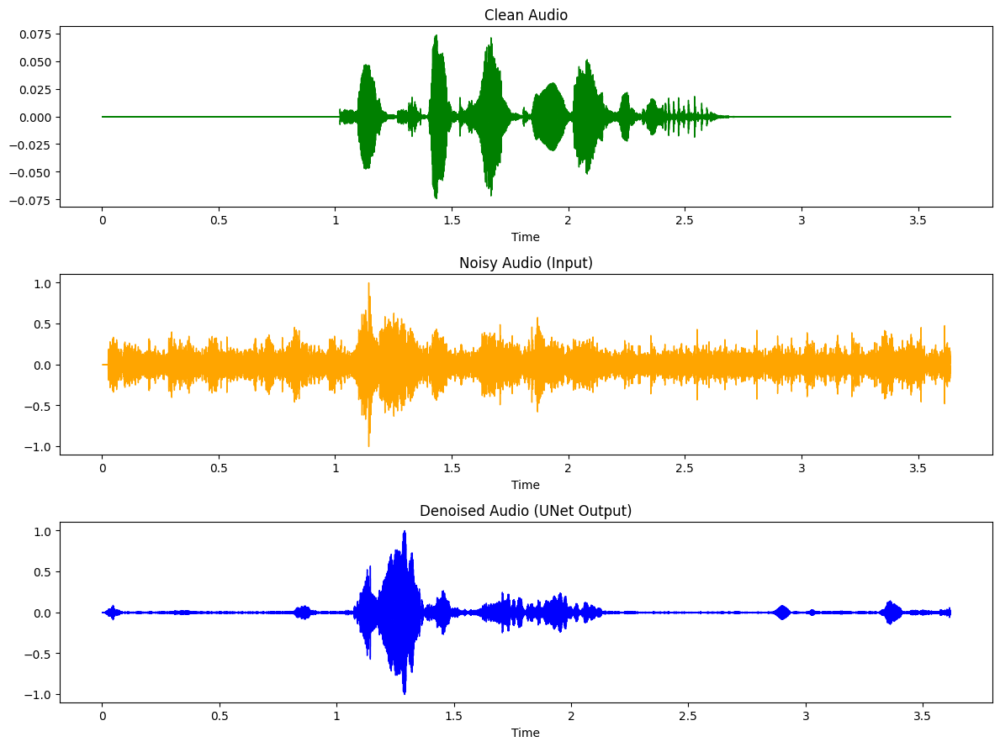

🎧 Clean Audio:


🎧 Noisy Audio:


🎧 Denoised Audio (UNet Output):


In [ ]:
import torch
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import os

# === Paths ===
model_path = "/content/drive/MyDrive/unet/best_unet.pth"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
noisy_path = "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_70.wav"

# === Load model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print("✅ Model loaded successfully.")

# === Load noisy audio ===
noisy, sr = librosa.load(noisy_path, sr=16000)
clean, _ = librosa.load(clean_path, sr=16000)

# === Compute STFT ===
n_fft = 1024
hop_length = 512
noisy_stft = librosa.stft(noisy, n_fft=n_fft, hop_length=hop_length)
noisy_mag, noisy_phase = np.abs(noisy_stft), np.angle(noisy_stft)

# === Model expects fixed shape (batch, 1, freq, time) ===
mag_tensor = torch.tensor(noisy_mag, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

with torch.no_grad(), torch.amp.autocast('cuda'):
    denoised_mag = model(mag_tensor).squeeze().cpu().numpy()

# === Reconstruct waveform using original phase ===
denoised_stft = denoised_mag * np.exp(1j * noisy_phase)
denoised_audio = librosa.istft(denoised_stft, hop_length=hop_length)

# === Normalize to avoid clipping ===
denoised_audio = denoised_audio / np.max(np.abs(denoised_audio))

# === Plot ===
plt.figure(figsize=(12, 9))

plt.subplot(3, 1, 1)
librosa.display.waveshow(clean, sr=sr, color='green')
plt.title("Clean Audio")

plt.subplot(3, 1, 2)
librosa.display.waveshow(noisy, sr=sr, color='orange')
plt.title("Noisy Audio (Input)")

plt.subplot(3, 1, 3)
librosa.display.waveshow(denoised_audio, sr=sr, color='blue')
plt.title("Denoised Audio (UNet Output)")

plt.tight_layout()
plt.show()

# === Listen ===
print("🎧 Clean Audio:")
ipd.display(ipd.Audio(clean, rate=sr))
print("🎧 Noisy Audio:")
ipd.display(ipd.Audio(noisy, rate=sr))
print("🎧 Denoised Audio (UNet Output):")
ipd.display(ipd.Audio(denoised_audio, rate=sr))


✅ Model loaded successfully on: cuda


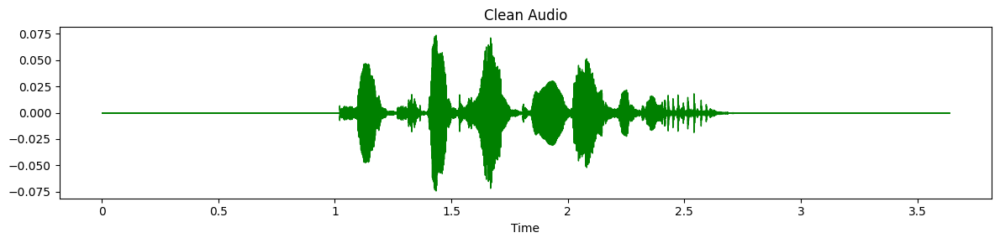

🎧 Clean Audio:


💾 Saved: /content/drive/MyDrive/unet/final_results/denoised/03-01-01-01-01-01-02_bubbles_30_denoised.wav


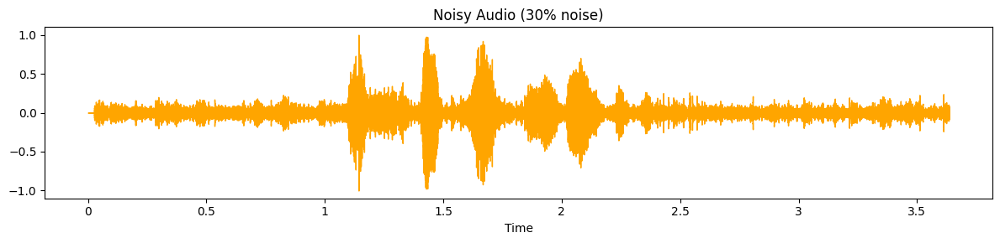

🎧 Noisy Audio (30%):


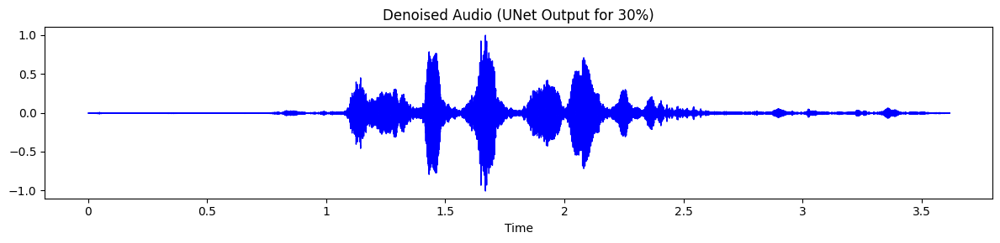

🎧 Denoised Audio (30%):


💾 Saved: /content/drive/MyDrive/unet/final_results/denoised/03-01-01-01-01-01-02_bubbles_50_denoised.wav


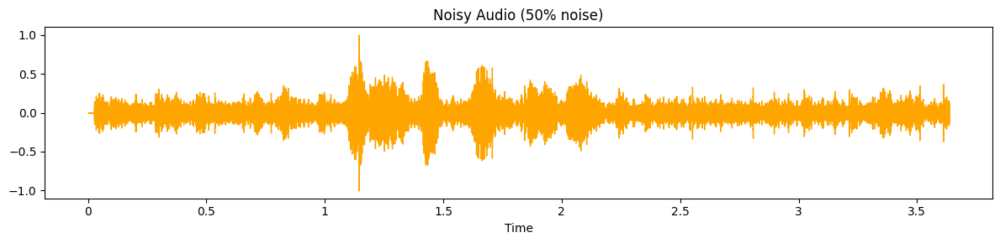

🎧 Noisy Audio (50%):


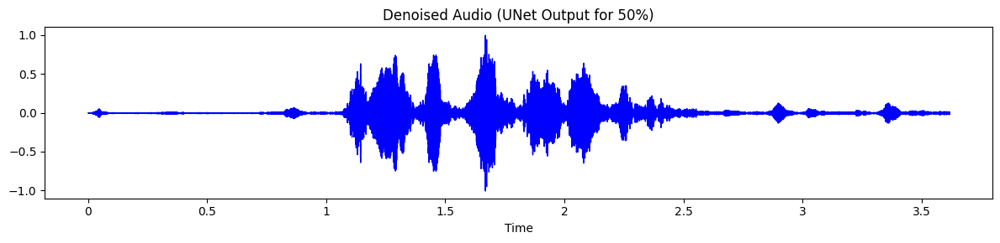

🎧 Denoised Audio (50%):


💾 Saved: /content/drive/MyDrive/unet/final_results/denoised/03-01-01-01-01-01-02_bubbles_70_denoised.wav


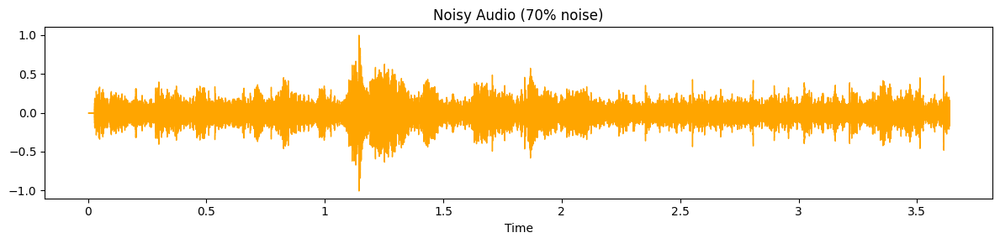

🎧 Noisy Audio (70%):


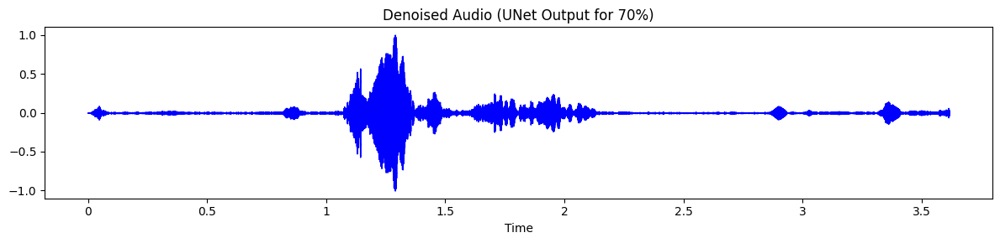

🎧 Denoised Audio (70%):


In [ ]:
import torch
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
import IPython.display as ipd
import os

# === Paths ===
model_path = "/content/drive/MyDrive/unet/best_unet.pth"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
mix_base = "/content/drive/MyDrive/unet/mixed_balanced_wav"
save_base = "/content/drive/MyDrive/unet/final_results"

os.makedirs(os.path.join(save_base, "denoised"), exist_ok=True)

# === Load model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print("✅ Model loaded successfully on:", device)

# === Load clean ===
clean, sr = librosa.load(clean_path, sr=16000)

# === Mix files ===
mix_levels = [30, 50, 70]
mix_files = [f"03-01-01-01-01-01-02_bubbles_{m}.wav" for m in mix_levels]

# === Step 1: Plot Clean Audio ===
plt.figure(figsize=(12, 3))
librosa.display.waveshow(clean, sr=sr, color='green')
plt.title("Clean Audio")
plt.tight_layout()
plt.show()

print("🎧 Clean Audio:")
ipd.display(ipd.Audio(clean, rate=sr))

# === Step 2: Process and Plot Noisy + Denoised ===
n_fft, hop_length = 1024, 512

for mix_file, ratio in zip(mix_files, mix_levels):
    noisy_path = os.path.join(mix_base, mix_file)
    noisy, _ = librosa.load(noisy_path, sr=sr)

    # --- Compute STFT ---
    noisy_stft = librosa.stft(noisy, n_fft=n_fft, hop_length=hop_length)
    noisy_mag, noisy_phase = np.abs(noisy_stft), np.angle(noisy_stft)

    # --- Model inference ---
    mag_tensor = torch.tensor(noisy_mag, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
    with torch.no_grad(), torch.amp.autocast('cuda'):
        denoised_mag = model(mag_tensor).squeeze().cpu().numpy()

    # --- ISTFT reconstruct ---
    denoised_stft = denoised_mag * np.exp(1j * noisy_phase)
    denoised_audio = librosa.istft(denoised_stft, hop_length=hop_length)
    denoised_audio = denoised_audio / np.max(np.abs(denoised_audio))

    # --- Save denoised wav ---
    denoised_path = os.path.join(save_base, "denoised", mix_file.replace(".wav", "_denoised.wav"))
    sf.write(denoised_path, denoised_audio, sr)
    print(f"💾 Saved: {denoised_path}")

    # --- Plot Noisy ---
    plt.figure(figsize=(12, 3))
    librosa.display.waveshow(noisy, sr=sr, color='orange')
    plt.title(f"Noisy Audio ({ratio}% noise)")
    plt.tight_layout()
    plt.show()

    print(f"🎧 Noisy Audio ({ratio}%):")
    ipd.display(ipd.Audio(noisy, rate=sr))

    # --- Plot Denoised ---
    plt.figure(figsize=(12, 3))
    librosa.display.waveshow(denoised_audio, sr=sr, color='blue')
    plt.title(f"Denoised Audio (UNet Output for {ratio}%)")
    plt.tight_layout()
    plt.show()

    print(f"🎧 Denoised Audio ({ratio}%):")
    ipd.display(ipd.Audio(denoised_audio, rate=sr))


🎵 Spectrogram Comparison for 30% Noise Mix


/tmp/ipython-input-676011567.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


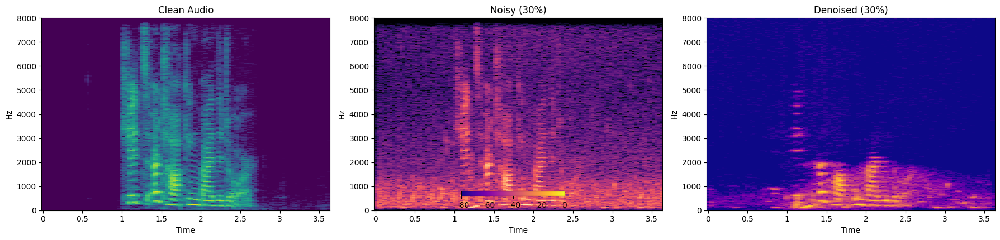

🎵 Spectrogram Comparison for 50% Noise Mix


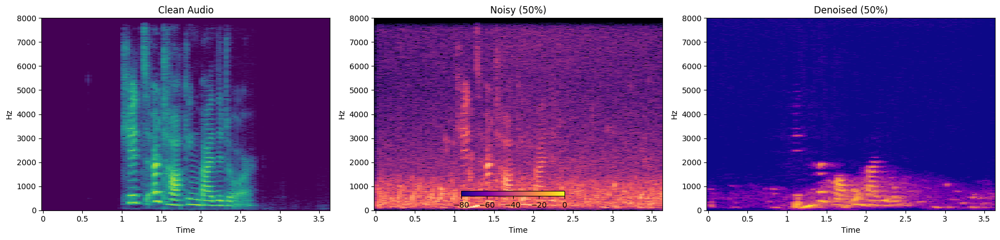

🎵 Spectrogram Comparison for 70% Noise Mix


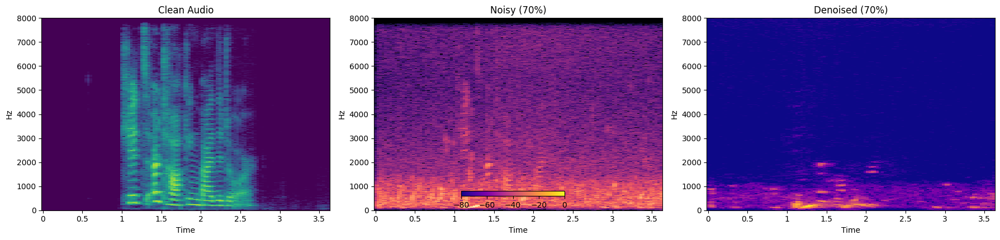

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import torch
import os
from scipy.io.wavfile import write

# === Paths ===
base_dir = "/content/drive/MyDrive/unet/final_results"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
mix_paths = [
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_30.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_50.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_70.wav",
]
denoised_paths = [
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_30_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_50_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_70_denoised.wav"),
]

# === Load clean ===
clean, sr = librosa.load(clean_path, sr=16000)

def plot_spectrograms(clean, noisy, denoised, sr, ratio):
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    # Clean
    clean_spec = librosa.amplitude_to_db(np.abs(librosa.stft(clean)), ref=np.max)
    img1 = librosa.display.specshow(clean_spec, sr=sr, x_axis='time', y_axis='hz', ax=axes[0], cmap='viridis')
    axes[0].set_title("Clean Audio")

    # Noisy
    noisy_spec = librosa.amplitude_to_db(np.abs(librosa.stft(noisy)), ref=np.max)
    img2 = librosa.display.specshow(noisy_spec, sr=sr, x_axis='time', y_axis='hz', ax=axes[1], cmap='magma')
    axes[1].set_title(f"Noisy ({ratio}%)")

    # Denoised
    den_spec = librosa.amplitude_to_db(np.abs(librosa.stft(denoised)), ref=np.max)
    img3 = librosa.display.specshow(den_spec, sr=sr, x_axis='time', y_axis='hz', ax=axes[2], cmap='plasma')
    axes[2].set_title(f"Denoised ({ratio}%)")

    fig.colorbar(img3, ax=axes, orientation='horizontal', fraction=0.03, pad=0.1)
    plt.tight_layout()
    plt.show()

# === Generate plots for each ratio ===
for mix_path, den_path in zip(mix_paths, denoised_paths):
    ratio = mix_path.split('_')[-1].replace('.wav', '')
    noisy, _ = librosa.load(mix_path, sr=sr)
    denoised, _ = librosa.load(den_path, sr=sr)
    print(f"🎵 Spectrogram Comparison for {ratio}% Noise Mix")
    plot_spectrograms(clean, noisy, denoised, sr, ratio)


🎵 Generating Spectrogram Comparison for 30% Mix...


/tmp/ipython-input-3292492494.py:47: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


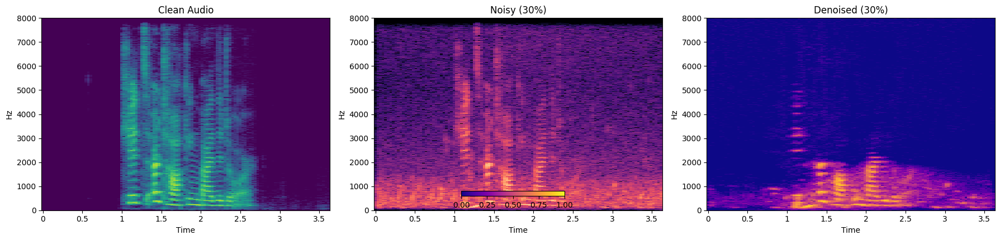

✅ Saved spectrogram: /content/drive/MyDrive/unet/final_results/spectrograms/spectrogram_comparison_30.png
🎵 Generating Spectrogram Comparison for 50% Mix...


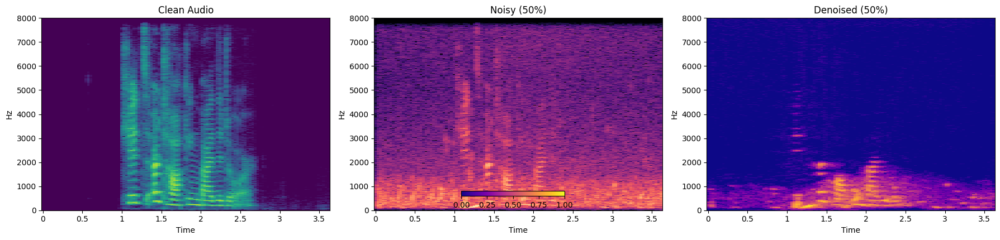

✅ Saved spectrogram: /content/drive/MyDrive/unet/final_results/spectrograms/spectrogram_comparison_50.png
🎵 Generating Spectrogram Comparison for 70% Mix...


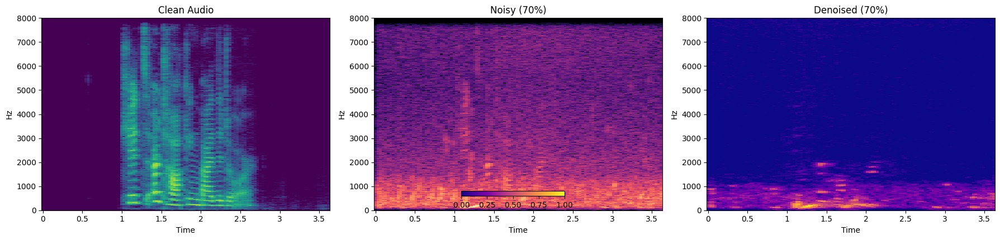

✅ Saved spectrogram: /content/drive/MyDrive/unet/final_results/spectrograms/spectrogram_comparison_70.png


In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import os

# === Paths ===
base_dir = "/content/drive/MyDrive/unet/final_results"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
mix_paths = [
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_30.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_50.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_70.wav",
]
denoised_paths = [
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_30_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_50_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_70_denoised.wav"),
]

# === Output folder for spectrograms ===
spec_save_dir = os.path.join(base_dir, "spectrograms")
os.makedirs(spec_save_dir, exist_ok=True)

# === Load clean ===
clean, sr = librosa.load(clean_path, sr=16000)

def plot_and_save_spectrograms(clean, noisy, denoised, sr, ratio, save_dir):
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    # Clean
    clean_spec = librosa.amplitude_to_db(np.abs(librosa.stft(clean)), ref=np.max)
    librosa.display.specshow(clean_spec, sr=sr, x_axis='time', y_axis='hz', ax=axes[0], cmap='viridis')
    axes[0].set_title("Clean Audio")

    # Noisy
    noisy_spec = librosa.amplitude_to_db(np.abs(librosa.stft(noisy)), ref=np.max)
    librosa.display.specshow(noisy_spec, sr=sr, x_axis='time', y_axis='hz', ax=axes[1], cmap='magma')
    axes[1].set_title(f"Noisy ({ratio}%)")

    # Denoised
    den_spec = librosa.amplitude_to_db(np.abs(librosa.stft(denoised)), ref=np.max)
    librosa.display.specshow(den_spec, sr=sr, x_axis='time', y_axis='hz', ax=axes[2], cmap='plasma')
    axes[2].set_title(f"Denoised ({ratio}%)")

    fig.colorbar(plt.cm.ScalarMappable(cmap='plasma'), ax=axes, orientation='horizontal', fraction=0.03, pad=0.1)
    plt.tight_layout()

    # === Save plot ===
    save_path = os.path.join(save_dir, f"spectrogram_comparison_{ratio}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved spectrogram: {save_path}")

# === Generate and save plots for each ratio ===
for mix_path, den_path in zip(mix_paths, denoised_paths):
    ratio = mix_path.split('_')[-1].replace('.wav', '')
    noisy, _ = librosa.load(mix_path, sr=sr)
    denoised, _ = librosa.load(den_path, sr=sr)
    print(f"🎵 Generating Spectrogram Comparison for {ratio}% Mix...")
    plot_and_save_spectrograms(clean, noisy, denoised, sr, ratio, spec_save_dir)


🎵 Generating Waveform Comparison for 30% Mix...


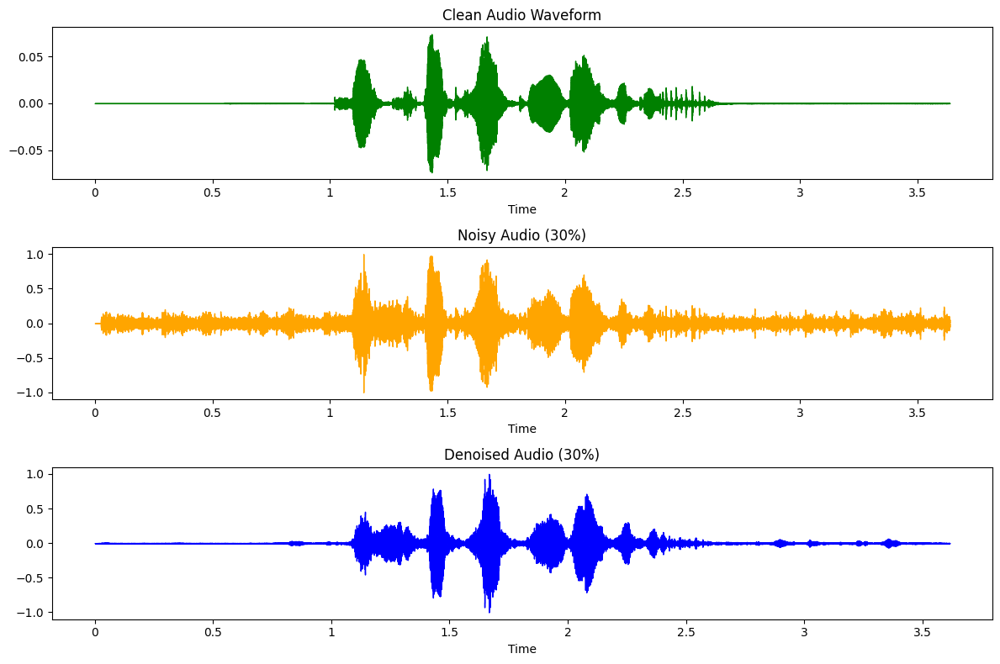

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_30.png
🎵 Generating Waveform Comparison for 50% Mix...


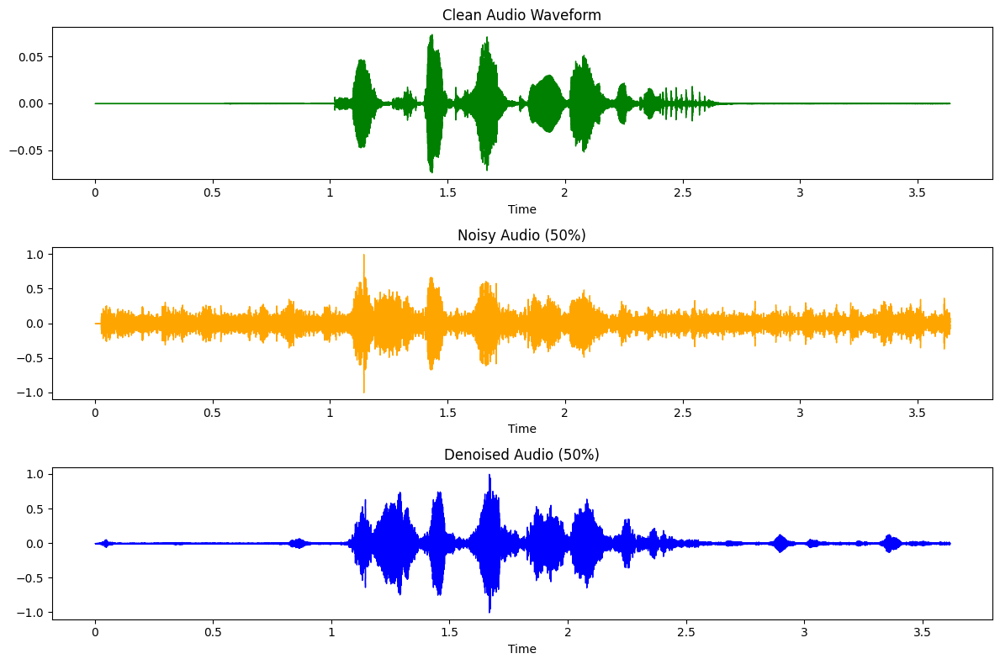

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_50.png
🎵 Generating Waveform Comparison for 70% Mix...


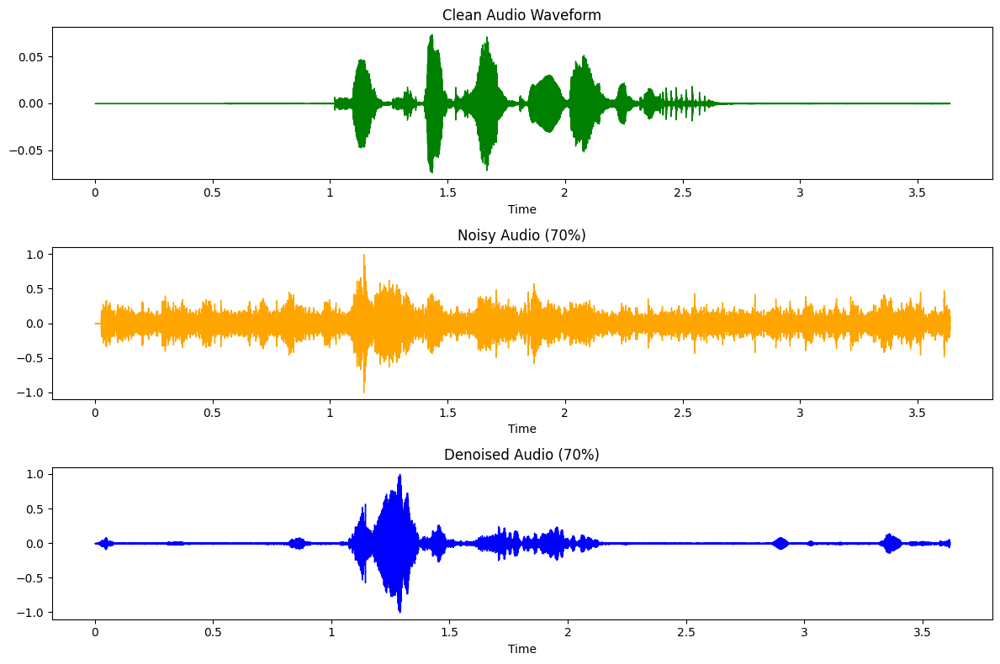

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_70.png


In [ ]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# === Paths ===
base_dir = "/content/drive/MyDrive/unet/final_results"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
mix_paths = [
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_30.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_50.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_70.wav",
]
denoised_paths = [
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_30_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_50_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_70_denoised.wav"),
]

# === Output folders ===
wave_save_dir = os.path.join(base_dir, "waveforms")
os.makedirs(wave_save_dir, exist_ok=True)

# === Load clean ===
clean, sr = librosa.load(clean_path, sr=16000)

def plot_and_save_waveforms(clean, noisy, denoised, sr, ratio, save_dir):
    fig, axes = plt.subplots(3, 1, figsize=(12, 8))

    # Clean
    librosa.display.waveshow(clean, sr=sr, ax=axes[0], color='green')
    axes[0].set_title("Clean Audio Waveform")

    # Noisy
    librosa.display.waveshow(noisy, sr=sr, ax=axes[1], color='orange')
    axes[1].set_title(f"Noisy Audio ({ratio}%)")

    # Denoised
    librosa.display.waveshow(denoised, sr=sr, ax=axes[2], color='blue')
    axes[2].set_title(f"Denoised Audio ({ratio}%)")

    plt.tight_layout()

    # === Save plot ===
    save_path = os.path.join(save_dir, f"waveform_comparison_{ratio}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved waveform plot: {save_path}")

# === Generate and save plots for each ratio ===
for mix_path, den_path in zip(mix_paths, denoised_paths):
    ratio = mix_path.split('_')[-1].replace('.wav', '')
    noisy, _ = librosa.load(mix_path, sr=sr)
    denoised, _ = librosa.load(den_path, sr=sr)
    print(f"🎵 Generating Waveform Comparison for {ratio}% Mix...")
    plot_and_save_waveforms(clean, noisy, denoised, sr, ratio, wave_save_dir)


🎵 Generating Waveform Comparison for 30% Mix...


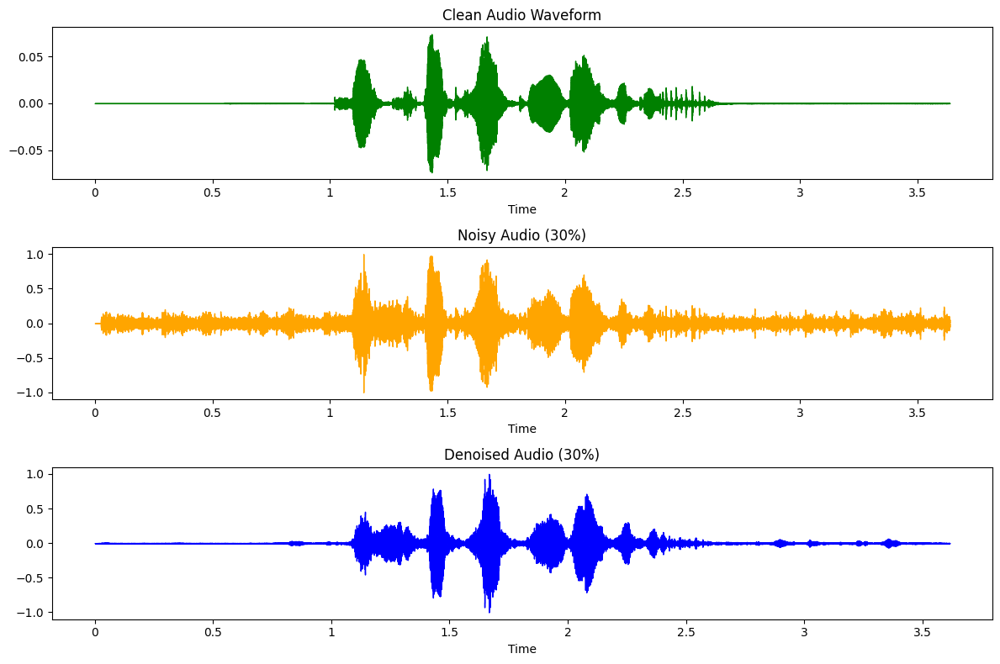

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_30.png
🎵 Generating Waveform Comparison for 50% Mix...


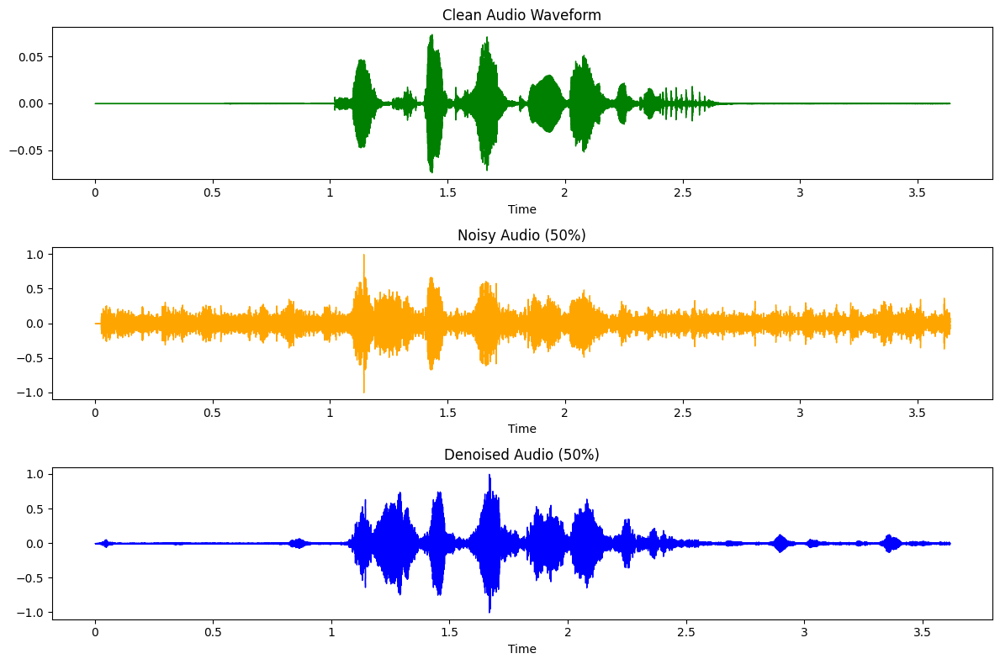

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_50.png
🎵 Generating Waveform Comparison for 70% Mix...


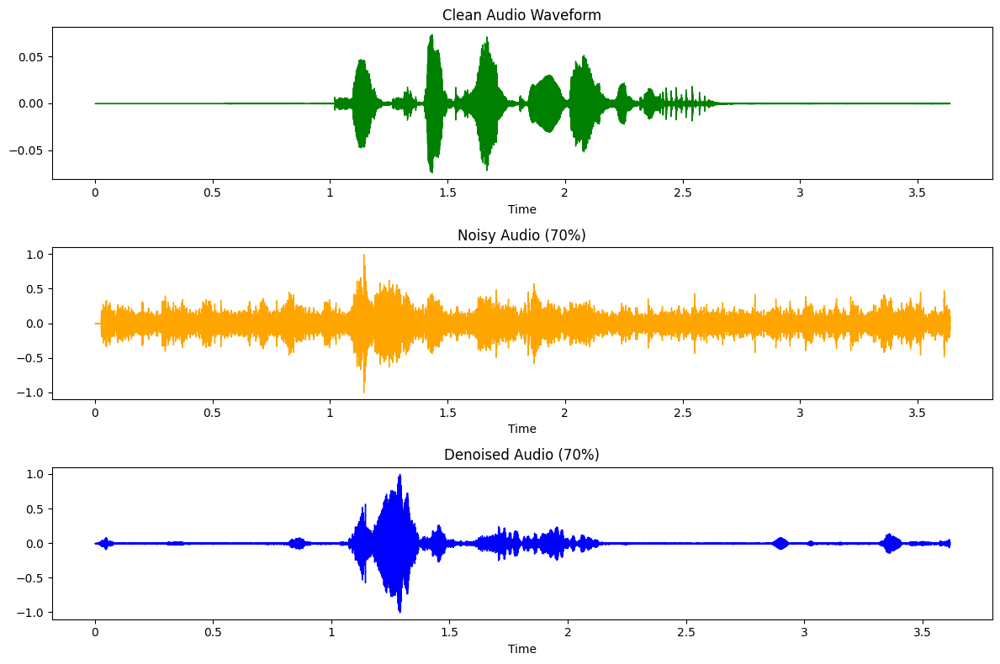

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_70.png


In [4]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# === Paths ===
base_dir = "/content/drive/MyDrive/unet/final_results"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
mix_paths = [
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_30.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_50.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_70.wav",
]
denoised_paths = [
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_30_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_50_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_70_denoised.wav"),
]

# === Output folders ===
wave_save_dir = os.path.join(base_dir, "waveforms")
os.makedirs(wave_save_dir, exist_ok=True)

# === Load clean ===
clean, sr = librosa.load(clean_path, sr=16000)

def plot_and_save_waveforms(clean, noisy, denoised, sr, ratio, save_dir):
    fig, axes = plt.subplots(3, 1, figsize=(12, 8))

    # Clean
    librosa.display.waveshow(clean, sr=sr, ax=axes[0], color='green')
    axes[0].set_title("Clean Audio Waveform")

    # Noisy
    librosa.display.waveshow(noisy, sr=sr, ax=axes[1], color='orange')
    axes[1].set_title(f"Noisy Audio ({ratio}%)")

    # Denoised
    librosa.display.waveshow(denoised, sr=sr, ax=axes[2], color='blue')
    axes[2].set_title(f"Denoised Audio ({ratio}%)")

    plt.tight_layout()

    # === Save plot ===
    save_path = os.path.join(save_dir, f"waveform_comparison_{ratio}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved waveform plot: {save_path}")

# === Generate and save plots for each ratio ===
for mix_path, den_path in zip(mix_paths, denoised_paths):
    ratio = mix_path.split('_')[-1].replace('.wav', '')
    noisy, _ = librosa.load(mix_path, sr=sr)
    denoised, _ = librosa.load(den_path, sr=sr)
    print(f"🎵 Generating Waveform Comparison for {ratio}% Mix...")
    plot_and_save_waveforms(clean, noisy, denoised, sr, ratio, wave_save_dir)


🎵 Generating Waveform Comparison for 30% Mix...
📊 SNR before denoising:  -23.55 dB
📊 SNR after denoising:   -21.97 dB
✨ SNR improvement:       1.58 dB



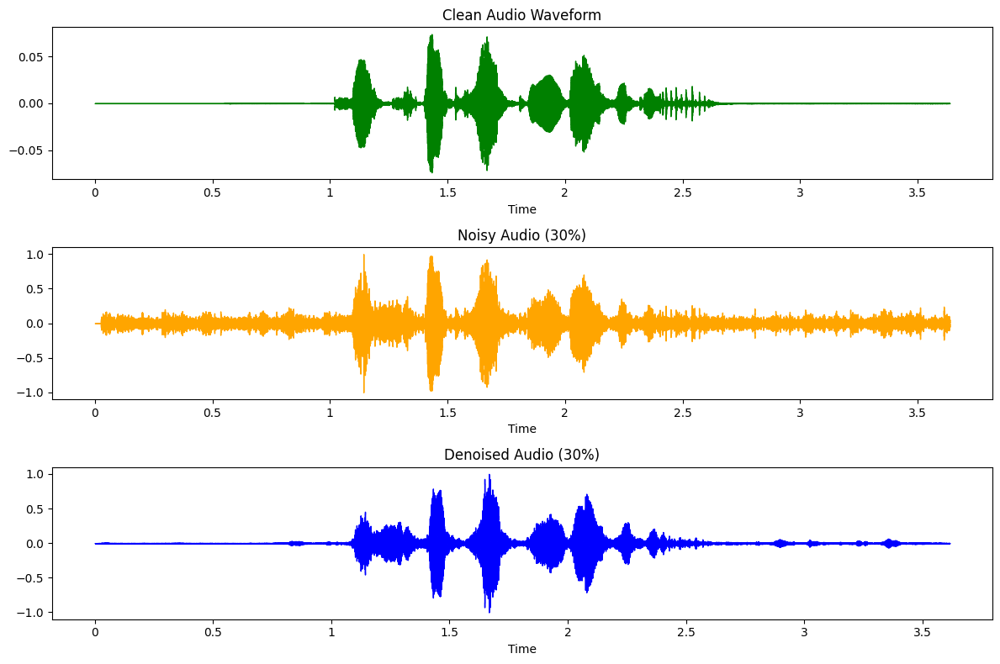

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_30.png
🎵 Generating Waveform Comparison for 50% Mix...
📊 SNR before denoising:  -23.91 dB
📊 SNR after denoising:   -24.63 dB
✨ SNR improvement:       -0.72 dB



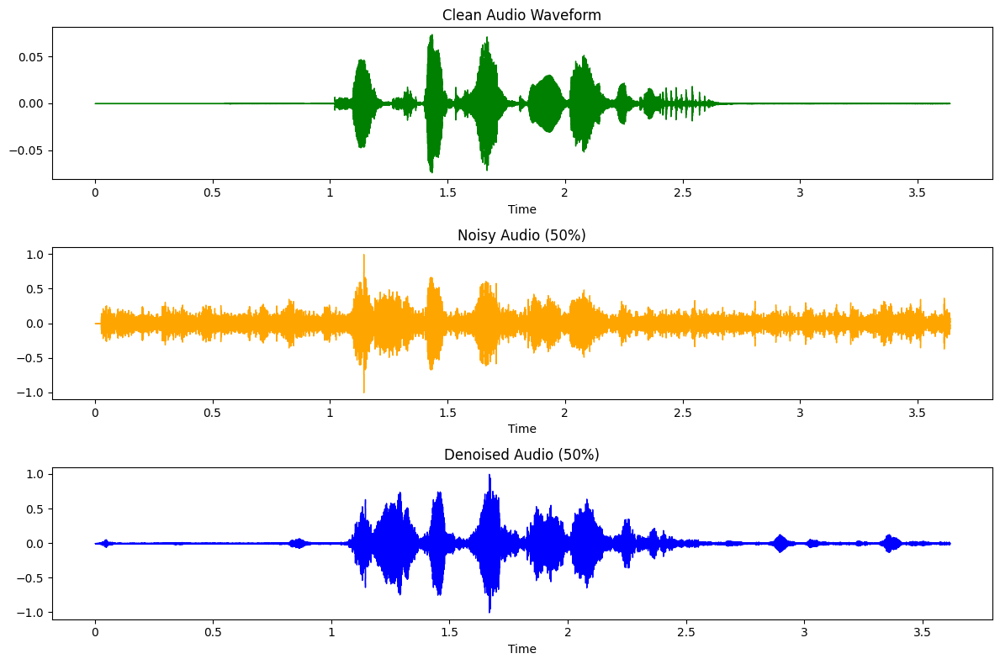

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_50.png
🎵 Generating Waveform Comparison for 70% Mix...
📊 SNR before denoising:  -25.19 dB
📊 SNR after denoising:   -24.01 dB
✨ SNR improvement:       1.18 dB



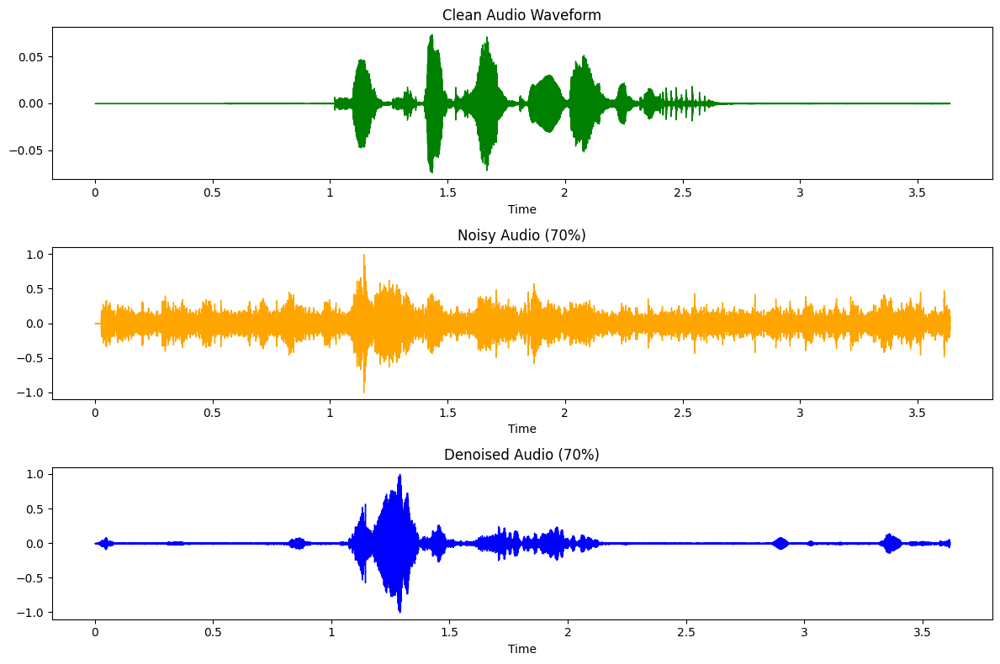

✅ Saved waveform plot: /content/drive/MyDrive/unet/final_results/waveforms/waveform_comparison_70.png


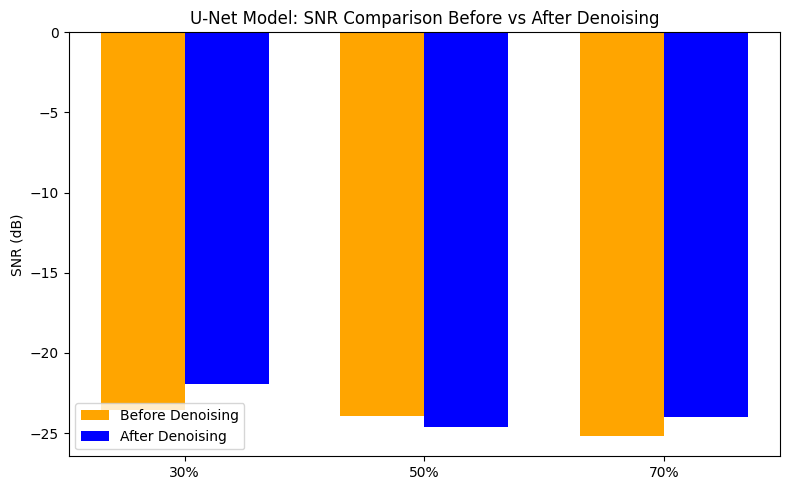

📈 Saved SNR comparison plot: /content/drive/MyDrive/unet/final_results/snr_comparison_unet.png


In [5]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# === Paths ===
base_dir = "/content/drive/MyDrive/unet/final_results"
clean_path = "/content/drive/MyDrive/unet/clean_wav/03-01-01-01-01-01-02.wav"
mix_paths = [
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_30.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_50.wav",
    "/content/drive/MyDrive/unet/mixed_balanced_wav/03-01-01-01-01-01-02_bubbles_70.wav",
]
denoised_paths = [
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_30_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_50_denoised.wav"),
    os.path.join(base_dir, "denoised", "03-01-01-01-01-01-02_bubbles_70_denoised.wav"),
]

# === Output folders ===
wave_save_dir = os.path.join(base_dir, "waveforms")
os.makedirs(wave_save_dir, exist_ok=True)

# === Load clean ===
clean, sr = librosa.load(clean_path, sr=16000)

# === Function: Compute SNR ===
def compute_snr(clean, test):
    """Compute Signal-to-Noise Ratio (SNR) between clean and test signals."""
    min_len = min(len(clean), len(test))
    clean = clean[:min_len]
    test = test[:min_len]
    noise = clean - test
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean(noise ** 2)
    snr = 10 * np.log10(signal_power / (noise_power + 1e-10))
    return snr

# === Function: Plot and save waveforms ===
def plot_and_save_waveforms(clean, noisy, denoised, sr, ratio, save_dir):
    fig, axes = plt.subplots(3, 1, figsize=(12, 8))

    librosa.display.waveshow(clean, sr=sr, ax=axes[0], color='green')
    axes[0].set_title("Clean Audio Waveform")

    librosa.display.waveshow(noisy, sr=sr, ax=axes[1], color='orange')
    axes[1].set_title(f"Noisy Audio ({ratio}%)")

    librosa.display.waveshow(denoised, sr=sr, ax=axes[2], color='blue')
    axes[2].set_title(f"Denoised Audio ({ratio}%)")

    plt.tight_layout()
    save_path = os.path.join(save_dir, f"waveform_comparison_{ratio}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved waveform plot: {save_path}")

# === Generate and save plots + compute SNR ===
snr_before_list = []
snr_after_list = []
ratios = []

for mix_path, den_path in zip(mix_paths, denoised_paths):
    ratio = mix_path.split('_')[-1].replace('.wav', '')
    ratios.append(ratio)

    noisy, _ = librosa.load(mix_path, sr=sr)
    denoised, _ = librosa.load(den_path, sr=sr)

    snr_before = compute_snr(clean, noisy)
    snr_after = compute_snr(clean, denoised)
    snr_before_list.append(snr_before)
    snr_after_list.append(snr_after)

    print(f"🎵 Generating Waveform Comparison for {ratio}% Mix...")
    print(f"📊 SNR before denoising:  {snr_before:.2f} dB")
    print(f"📊 SNR after denoising:   {snr_after:.2f} dB")
    print(f"✨ SNR improvement:       {snr_after - snr_before:.2f} dB\n")

    plot_and_save_waveforms(clean, noisy, denoised, sr, ratio, wave_save_dir)

# === Optional: SNR Comparison Bar Plot ===
plt.figure(figsize=(8,5))
x = np.arange(len(ratios))
width = 0.35
plt.bar(x - width/2, snr_before_list, width, label='Before Denoising', color='orange')
plt.bar(x + width/2, snr_after_list, width, label='After Denoising', color='blue')
plt.xticks(x, [f"{r}%" for r in ratios])
plt.ylabel("SNR (dB)")
plt.title("U-Net Model: SNR Comparison Before vs After Denoising")
plt.legend()
plt.tight_layout()

snr_plot_path = os.path.join(base_dir, "snr_comparison_unet.png")
plt.savefig(snr_plot_path, dpi=300)
plt.show()
print(f"📈 Saved SNR comparison plot: {snr_plot_path}")
